<a href="https://colab.research.google.com/github/exponentialR/EducativeIOProjects/blob/main/YOLOV5_Object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.0-108-g53349da torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅


In [2]:
%pip install -q roboflow
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

     |████████████████████████████████| 145 kB 5.1 MB/s 
     |████████████████████████████████| 178 kB 29.1 MB/s 
     |████████████████████████████████| 1.1 MB 30.5 MB/s 
     |████████████████████████████████| 67 kB 4.1 MB/s 
     |████████████████████████████████| 138 kB 38.8 MB/s 
     |████████████████████████████████| 62 kB 649 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
Setup complete. Using torch 1.10.0+cu111 (Tesla K80)


In [3]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [4]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="rFGUEdq8aKVJw4pVkZNt")
project = rf.workspace().project("books-and-mugs")
dataset = project.version(3).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/Books-and-Mugs-3 in yolov5pytorch:: 100%|██████████| 452/452 [00:00<00:00, 563.87it/s]


In [6]:
!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/datasets/Books-and-Mugs-3/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-108-g53349da torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.

In [7]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [8]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Books-and-Mugs-3/test/images, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-108-g53349da torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/22 /content/datasets/Books-and-Mugs-3/test/images/Breafast_range_12_09_2019_10_hope-61_t0fk-iy_c4kh-k7_jpg.rf.3bf2a98f5c532cae1cf12f74a8998023.jpg: 416x416 7 Mugs, 1 Stacked_Books, Done. (0.025s)
image 2/22 /content/datasets/Books-and-Mugs-3/test/images/El-Aich_Mug20Yellow_jpg.rf.097e5758ca04b1679aed40ee02220801.jpg: 416x416 1 Mug, Done. (0.025s)
image 3/22 /co

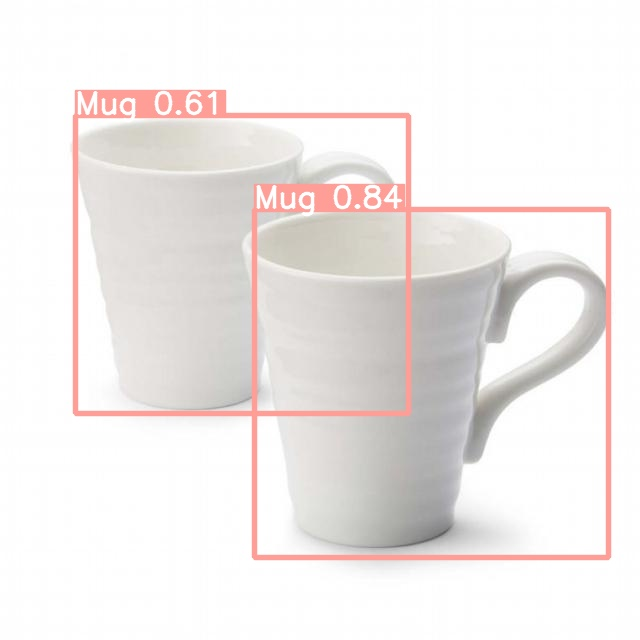

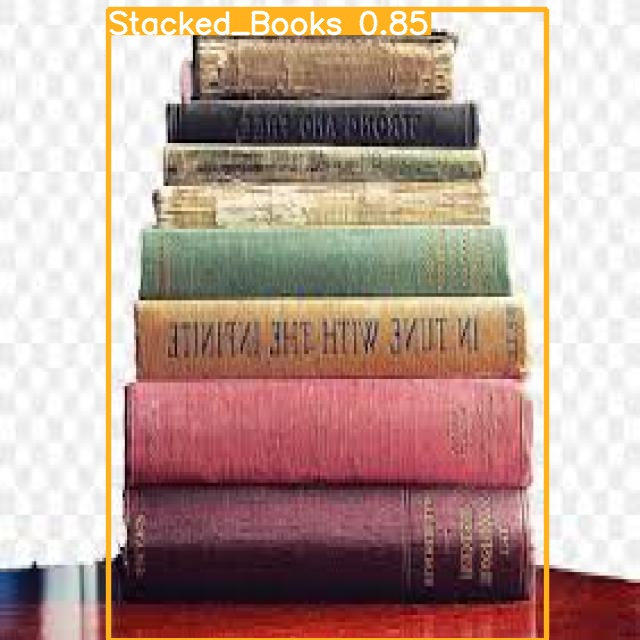

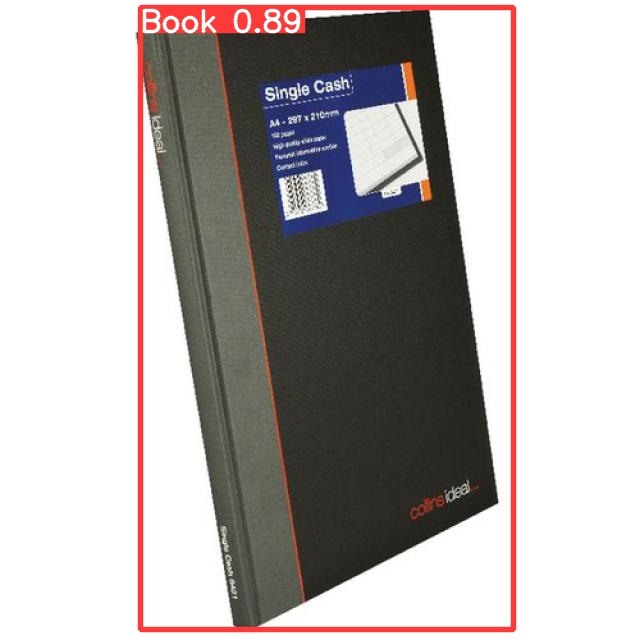

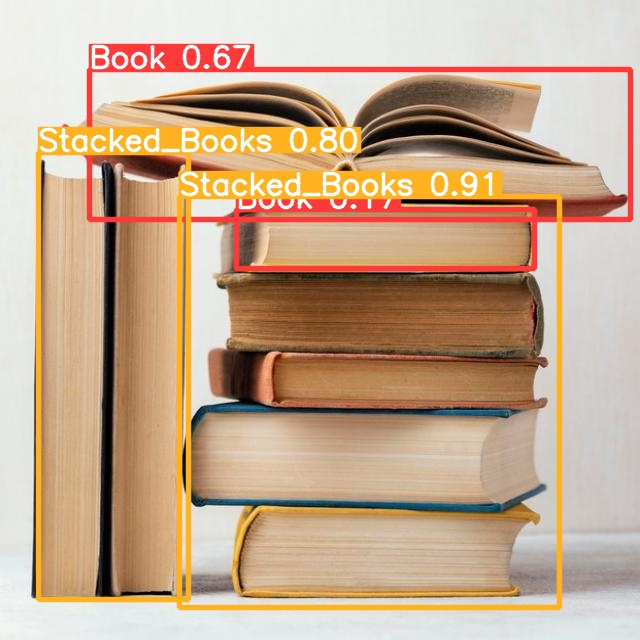

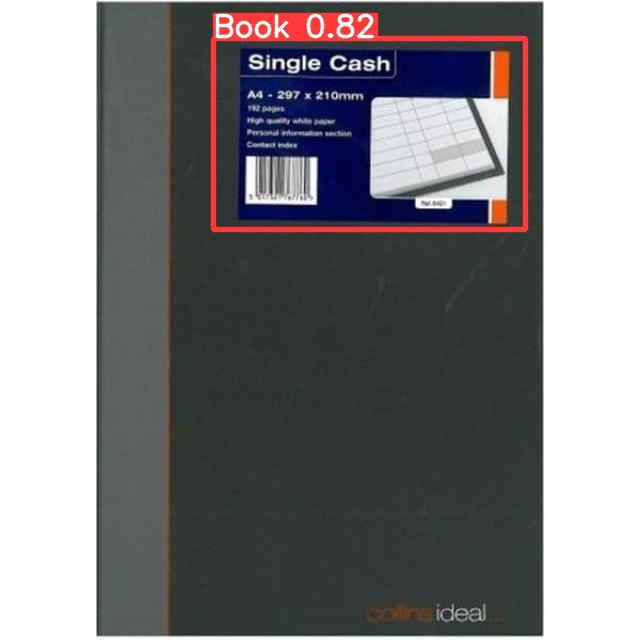

...

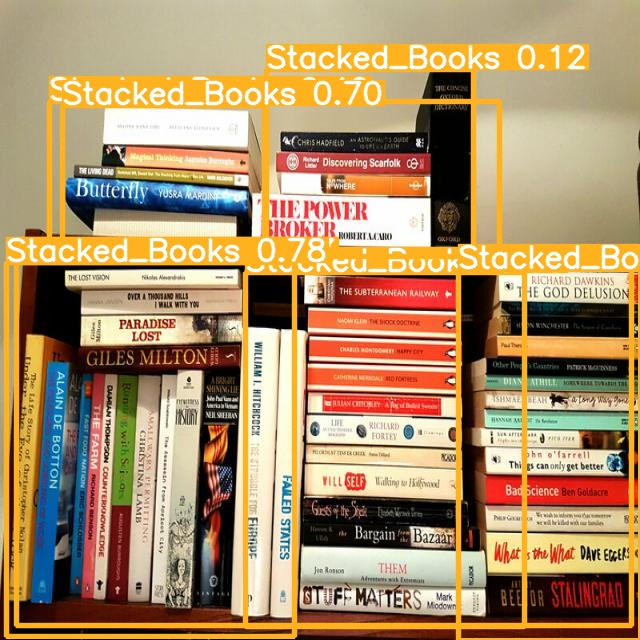

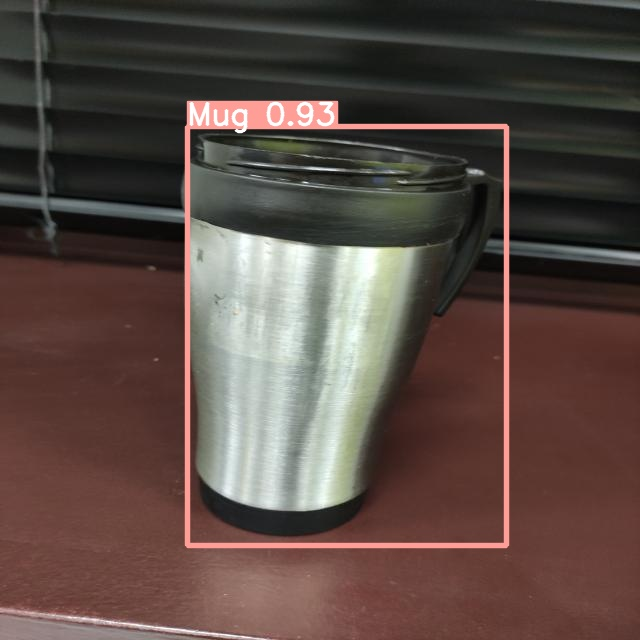

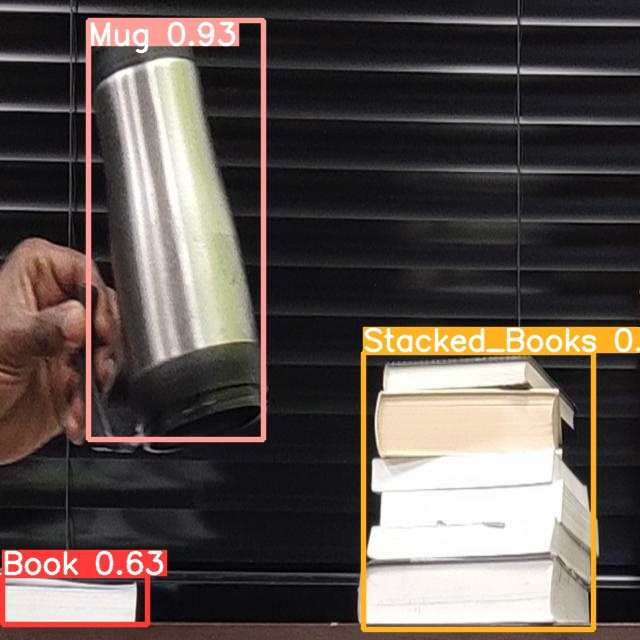

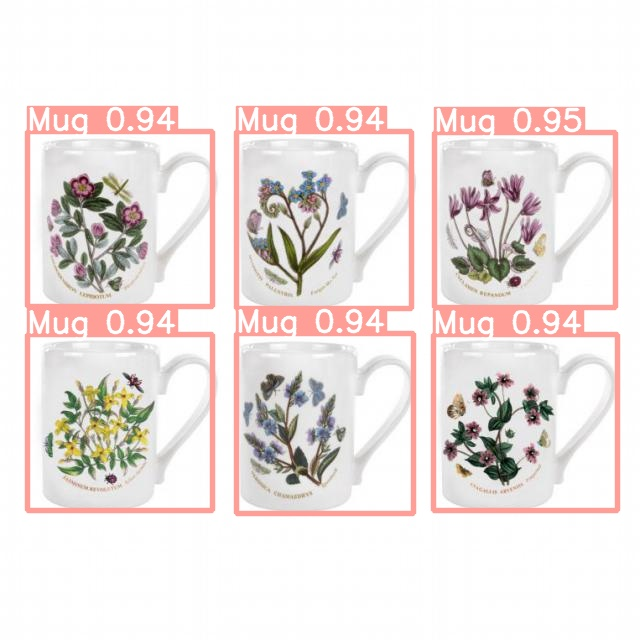

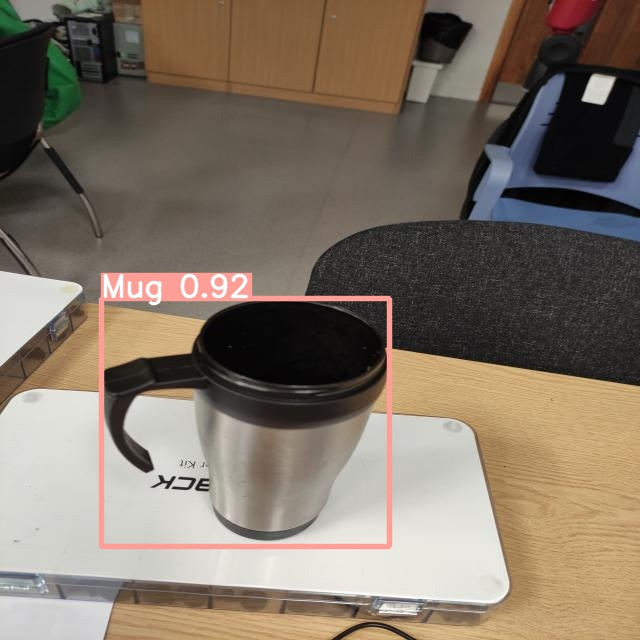

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [10]:
import numpy as np
def extract_bounding_box (frame):
  model= torch.hub.load('ultralytics/yolov5', 'yolov5l6', pretrained = True)
  detect_obj = model(frame[..., ::-1])
  results = detect_obj.pandas().xyxy[0].to_dict(orient = 'records')
  for result in results:
    confid = result['confidence']
    cla = result['class']
    x1 = int(result['xmin'])
    y1 = int(result['ymin'])
    x2 = int(result['xmax'])
    y2 = int(result['ymax'])
    if cla == 'Stacked_Books':

      Stacked_bboxx = np.array([x1, y1, x2, y2])
    elif cla == 'Mugs':
      Mugs_bboxx = np.array([x1, y1, x2, y2])
    else:
      Books_bboxx = np.array([x1, y1, x2, y2])
    # Stacked_bboxx = np.array([int(result['xmin']), int(result['ymin']), int(result['xmax']), y2 = int(result['ymax'])] for result in results if cla == 'Stacked_Books' else np.zeros(4))

  return np.concatenate([Stacked_bboxx, Mugs_bboxx, Books_bboxx])